In [1]:
import pickle
import random
import dadi
import os, sys
sys.path.append(os.path.join(os.getcwd(), '..')) # this is the ml_dadi dir
import data_manip, plotting
from data_manip import msprime_split_mig, msprime_generate_data
from plotting import plot_accuracy_multi
import matplotlib.pyplot as plt

In [ ]:
# # Commented out codes were used to generate data on HPC

# # generate test params (nu1, nu2, T, m) similar to dadi
# test_params = []
# while len(test_params) < 100: 
#     nu1 = random.random() * 4 - 2 # nu1 in log scale
#     nu2 = random.random() * 4 - 2 # nu2 in log scale
#     T = random.random() * 1.9 + 0.1
#     m = random.random() * 9 + 1
#     test_params.append((nu1, nu2, T, m))
# # print testing params info
# print('n_samples testing: ', len(test_params))
# print('Range of testing params:', min(test_params), 'to', max(test_params))

In [2]:
# # msprime demographic and ancestry simulation parameters (unchanged params)
# s1 = 1e4 # ancestral pop size
# ns = {"A":10, "B":10} # sample size
# ploidy = 2 # diploid
# mut = 1e-8 # mutation rate
# seq_l = 1e8 # sequence length

In [ ]:
# # make list of demographic models for msprime from list of test_params
# dem_list = [msprime_split_mig(s1, p) for p in test_params]

In [ ]:
# recomb_list = [1e-8, 1e-9, 1e-10, 1e-11]
# # need to make list of sample node ids to convert from ts to joint afs
# s0 = [node_id for node_id in range(0,20)]
# s1 = [node_id for node_id in range(20,40)]
# sample_nodes = [s0, s1]

In [ ]:
# # generate test data dictionary
# for recomb in recomb_list:
#     print(f'Sequence length: {seq_l:.1e}; Recombination rate: {recomb:.1e}')
#     test_d = msprime_generate_data(test_params, dem_list, ns, ploidy, seq_l, 
#                                     recomb, mut, sample_nodes)
#     pickle.dump(test_d, open(f'data/msprime/{seq_l:.1e}_{recomb:.1e}', 'wb'), 2)

In [5]:
# Load data generated from HPC
seq_l = 1e8
recomb_list = [1e-8, 1e-9, 1e-10, 1e-11]
list_test_dict = []
for recomb in recomb_list:
    test_d = pickle.load(open(f'data/msprime/{seq_l:.1e}_{recomb:.1e}', 'rb'))
    list_test_dict.append(test_d)

In [6]:
# load list of train rfr
list_rfr = pickle.load(open('data/new_func/list_rfr_random','rb'))
# load list of trained mlpr
list_mlpr = pickle.load(open('data/new_func/list_mlpr_random','rb'))

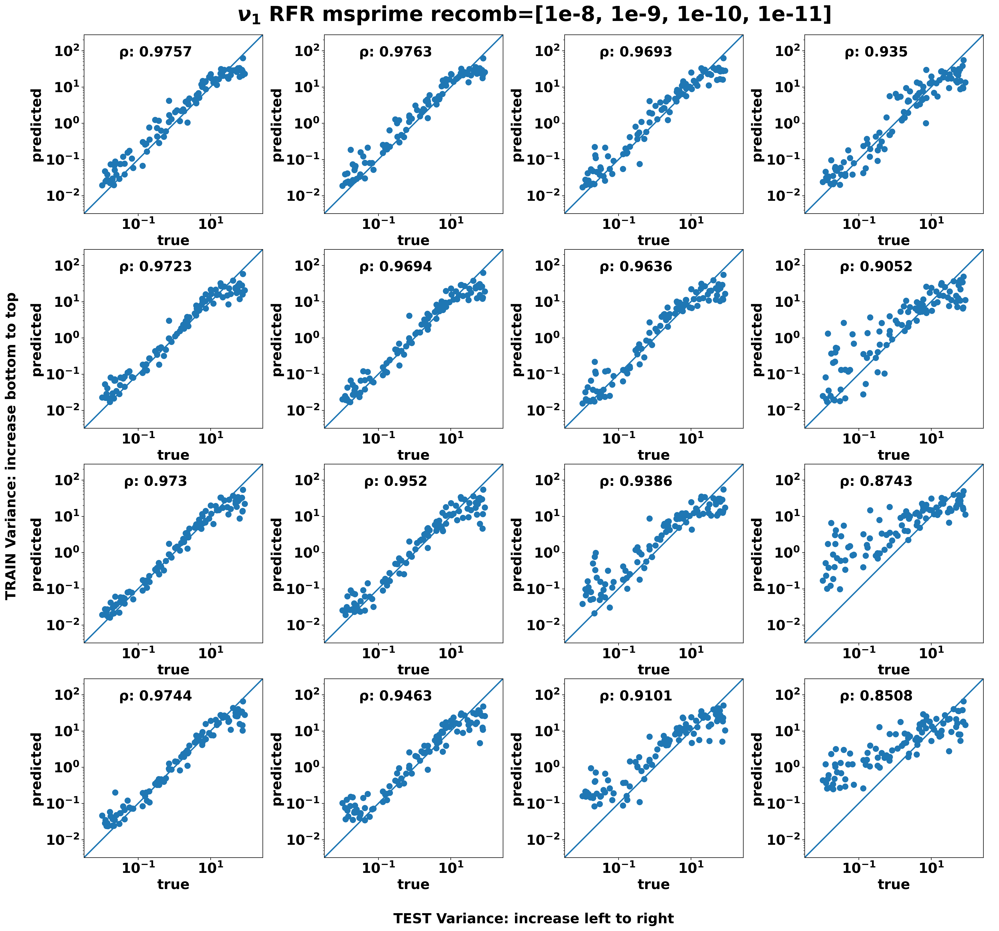

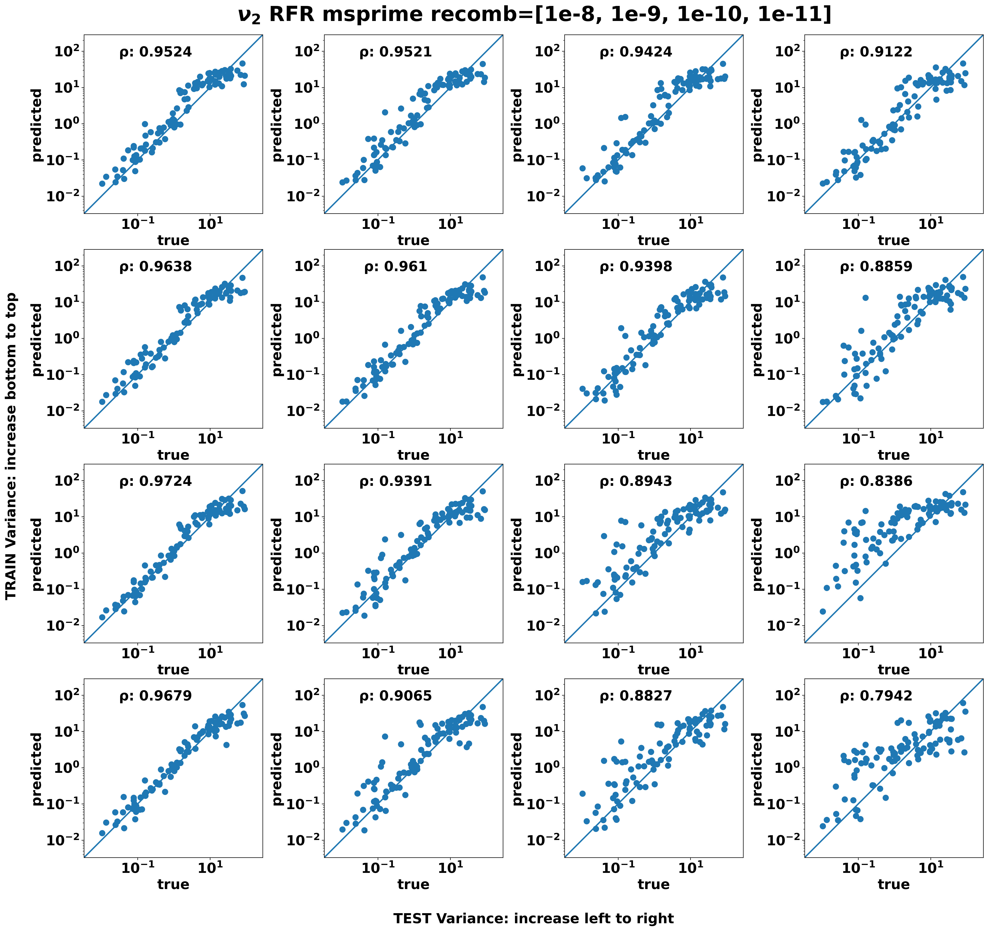

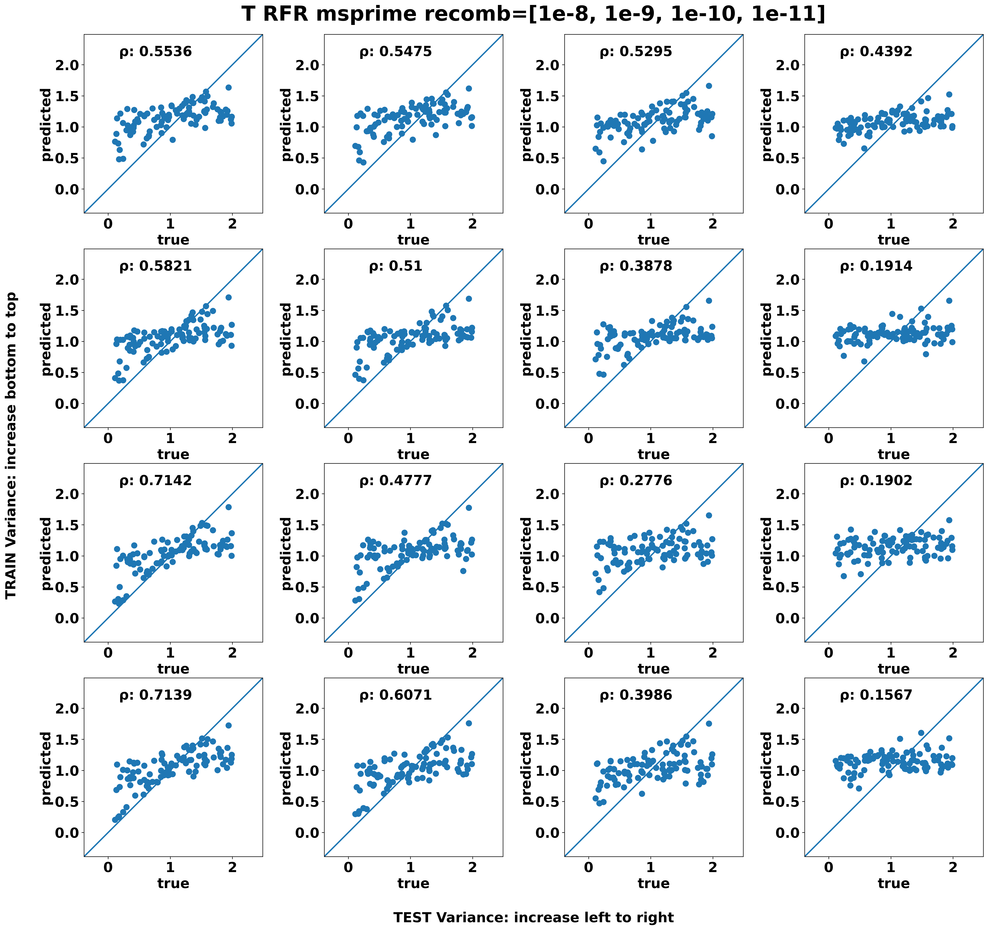

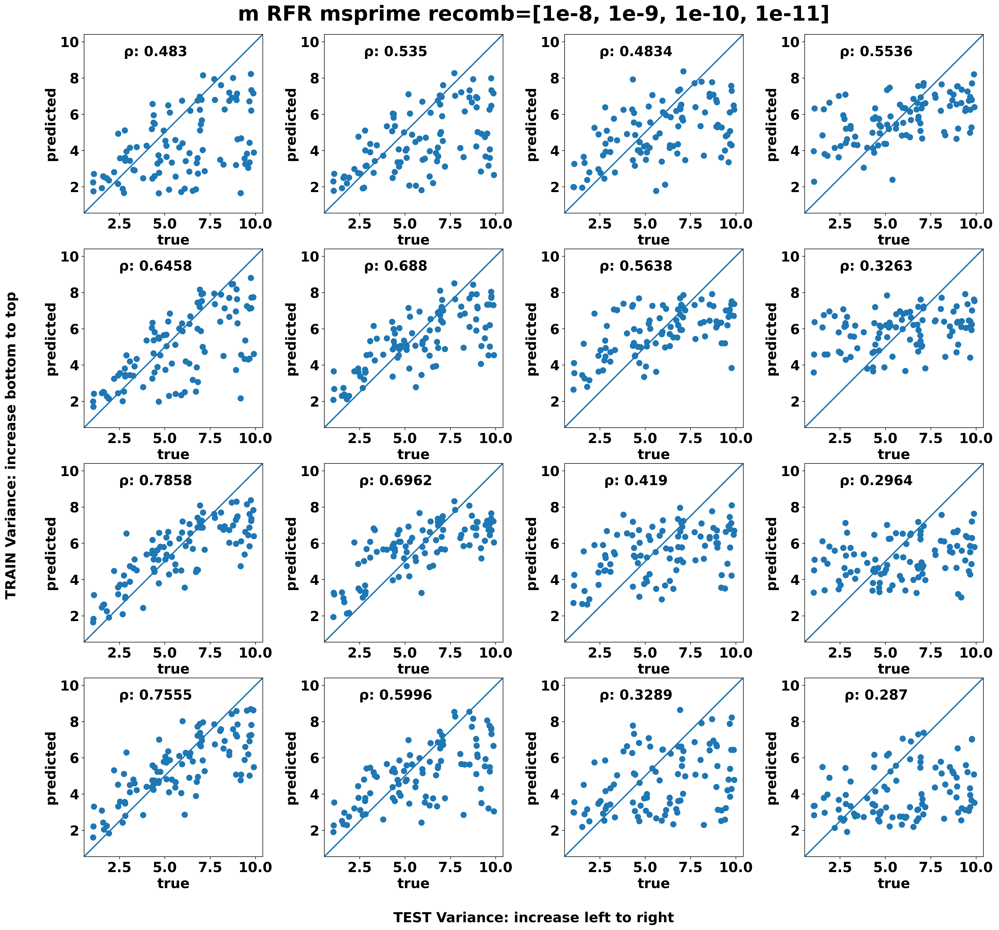

In [7]:
# Plot 4x4 RFR
params = [r'$ν_1$', r'$ν_2$', 'T', 'm']
model_name = 'RFR msprime recomb=[1e-8, 1e-9, 1e-10, 1e-11]'
logs = [True, True, False, False]
size = ((30, 20), (20, 80), (8,2,20), (24,22))
# size_format = ( (title_font_size, title_pad), (axis_font_size, axis_pad),
#                   (single_size_tuple), fig_size)
# single_size_tuple = (dots_size, line_width, font_size)
plot_accuracy_multi(list_rfr, list_test_dict, params, model_name, logs, size, r2=False)
# save fig

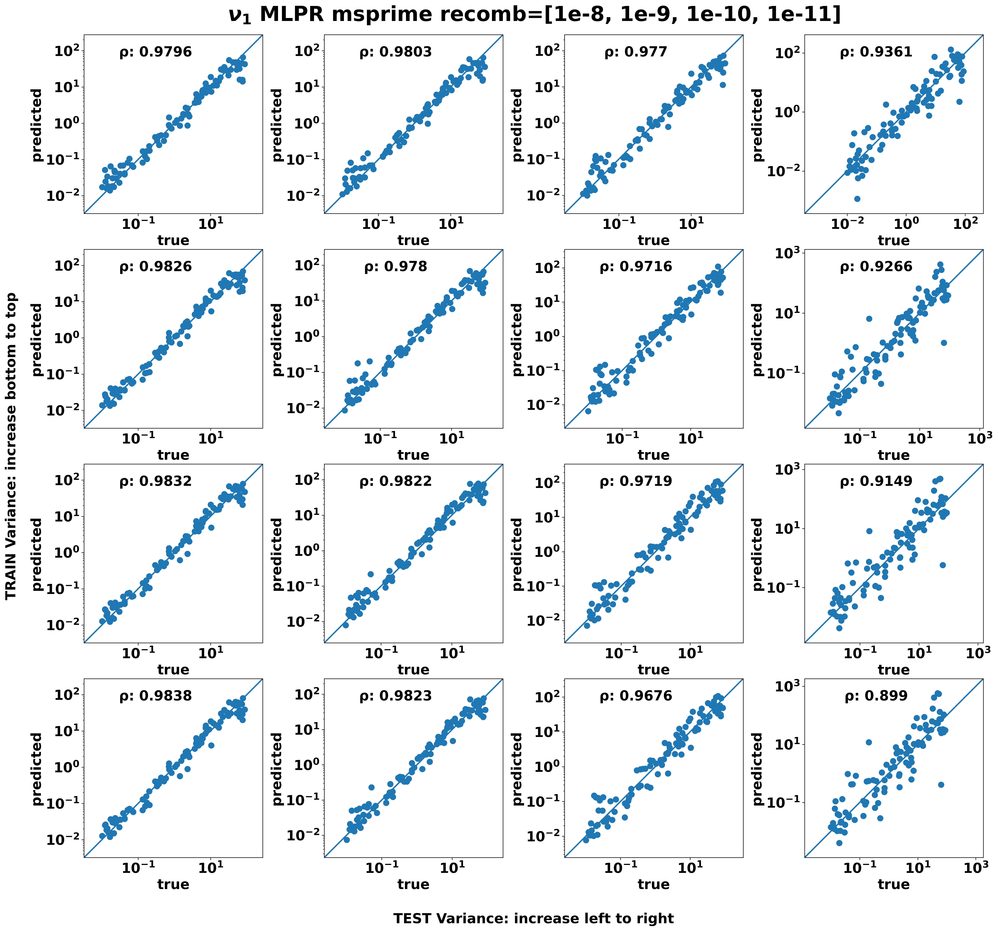

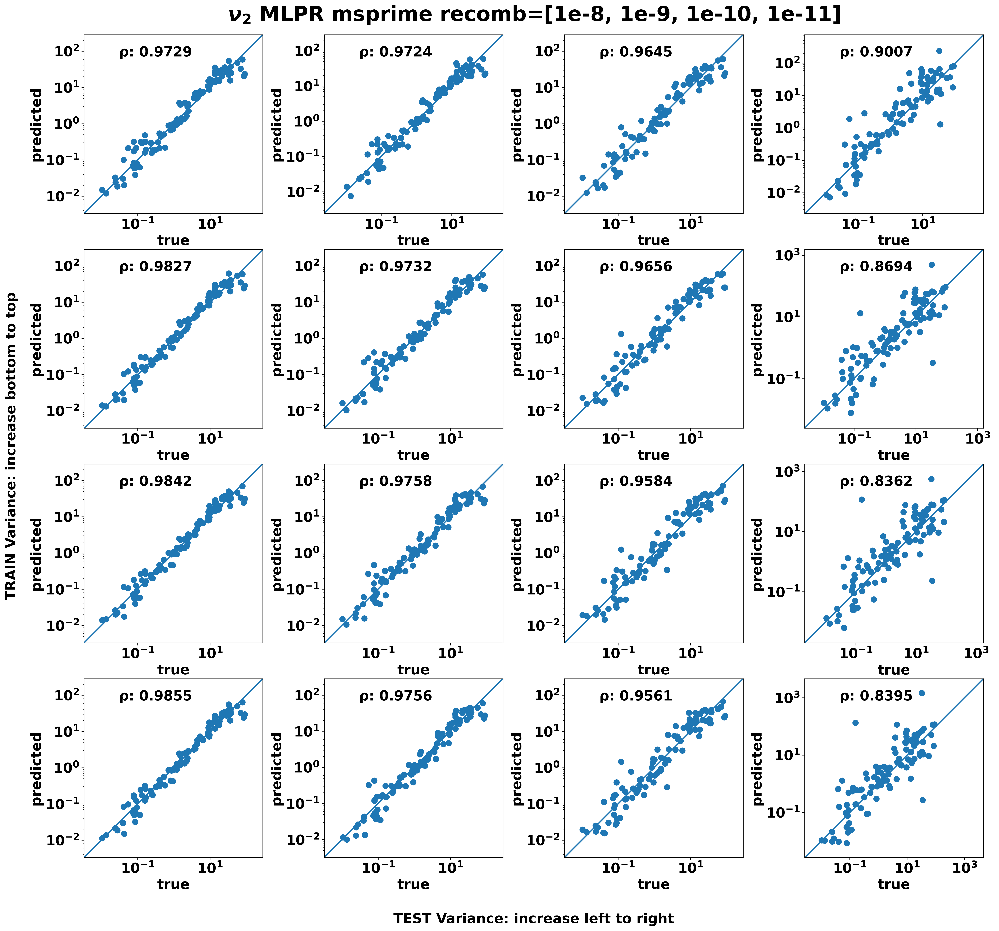

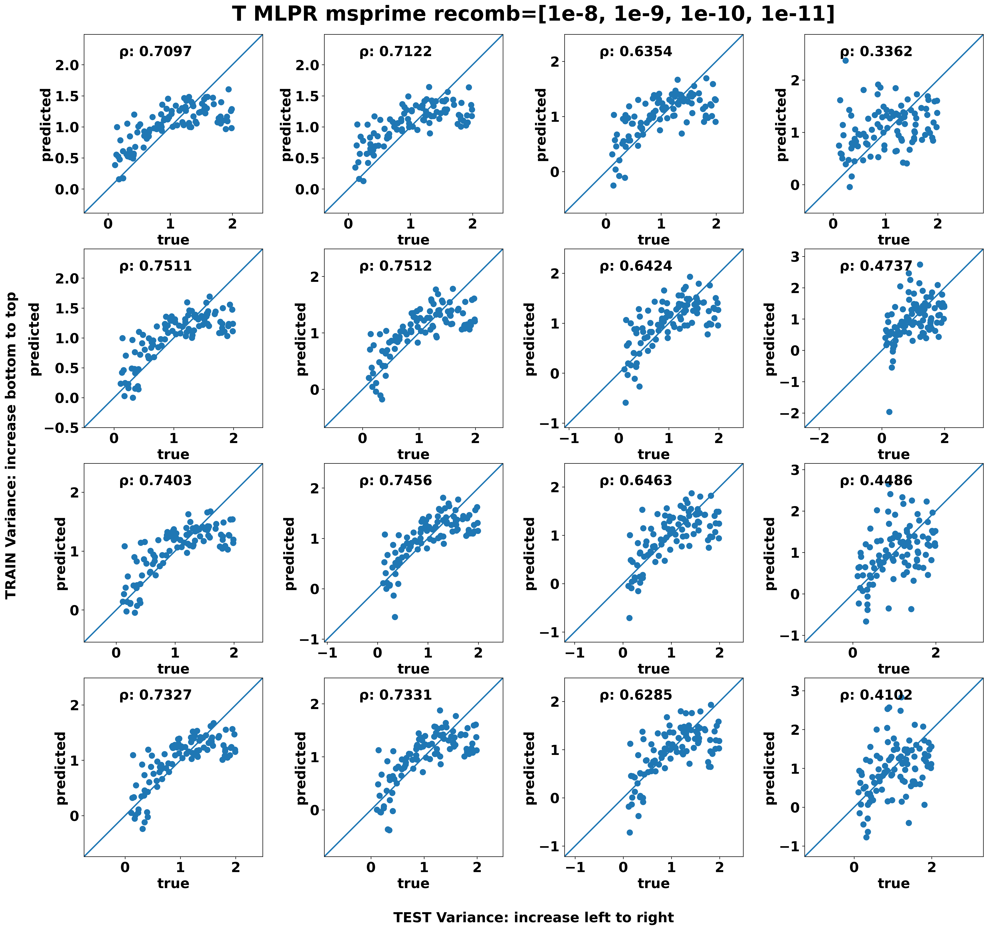

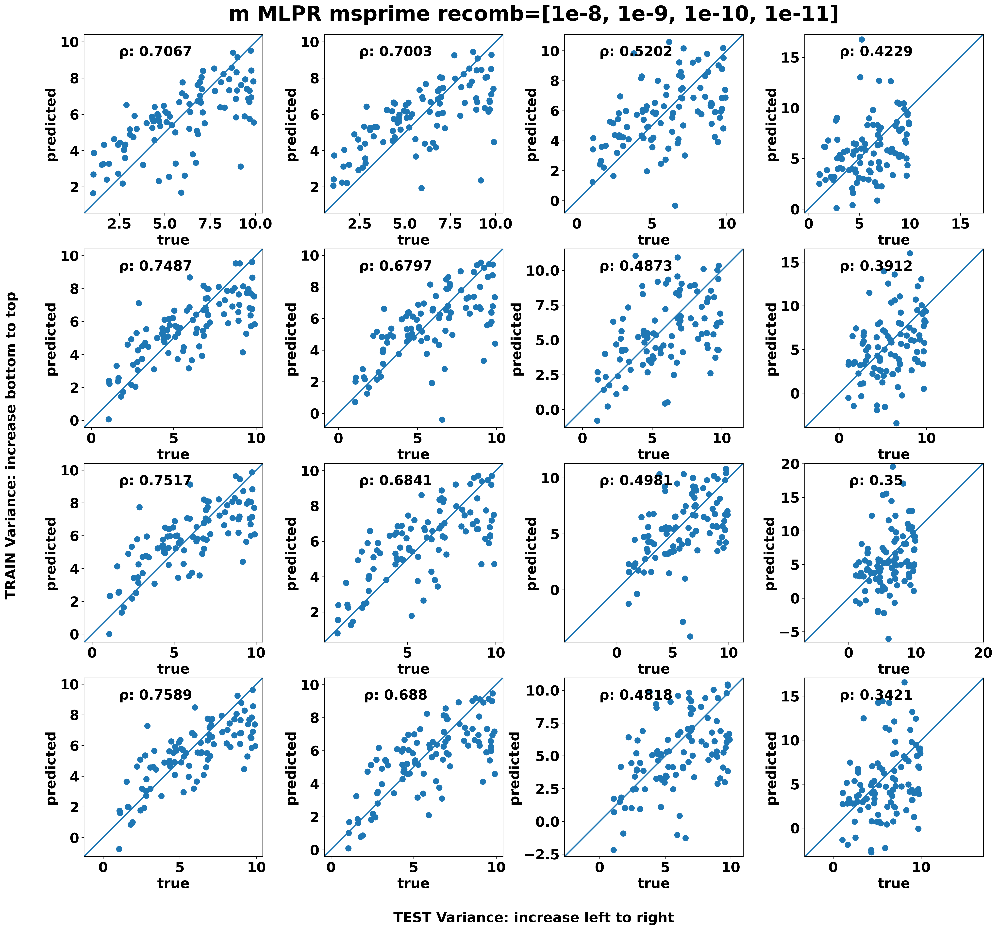

In [8]:
# Plot 4x4 MLPR
params = [r'$ν_1$', r'$ν_2$', 'T', 'm']
model_name = 'MLPR msprime recomb=[1e-8, 1e-9, 1e-10, 1e-11]'
logs = [True, True, False, False]
size = ((30, 20), (20, 80), (8,2,20), (24,22))
# size_format = ( (title_font_size, title_pad), (axis_font_size, axis_pad),
#                   (single_size_tuple), fig_size)
# single_size_tuple = (dots_size, line_width, font_size)
plot_accuracy_multi(list_mlpr, list_test_dict, 
                        params, model_name, logs, size, r2=False)
# # save fig
# for i in range(len(params)):
#     plt.figure(i+1).savefig(f'results/msprime/{params[i]}_mlpr_rec.png')